In [1]:
import import_ipynb
import Scanpy_functions_v03262021 as sc_pipe
import scvelo as scv
scv.logging.print_version()
import warnings
import scirpy as ir
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import bbknn
import logging
from sklearn.mixture import GaussianMixture
from scipy.stats     import norm
import glob
import os
import hvplot.pandas
import docx
from docx import Document
from docx.shared import Inches
from docx.shared import Pt
from scipy import sparse
import scanpy.external as sce
import holoviews as hv
import panel as pn
import bokeh
from bokeh.resources import INLINE
import scanorama
import gseapy

importing Jupyter notebook from Scanpy_functions_v03262021.ipynb
Running scvelo 0.2.3 (python 3.8.5) on 2022-02-21 10:45.
Running scvelo 0.2.3 (python 3.8.5) on 2022-02-21 10:45.


In [2]:
# define sample metadata. Usually read from a file.
exclude_genes = ['Rpl', 'Rps', 'Trav', 'Traj', 'Trbj', 'Trbv','Mrp','Fau','Dap3','Uba52','Ighv', 'Igkv', 'Iglv']


In_path = '/user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/'

out_path = '/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/'

In [3]:
#sc.set_figure_params(scanpy=True, dpi=200,  figsize=[12.8,9.6])
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization


In [4]:
adata = sc.read_h5ad(out_path+'/human_velocity_integrated_all_sample.h5ad')
labled = sc.read_h5ad(out_path+'/human_ingested_label.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 234259 × 27210
    obs: 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts', 'Cell_Type', 'condition', 'Selected_group', 'SatM_like', 'human_clusters', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition', 'S_score', 'G2M_score', 'phase', 'clusters_gradients', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'Accession', 'Chromosome', 'End', 'Start', 'Stra

In [6]:
adata.obs=labled.obs
del labled

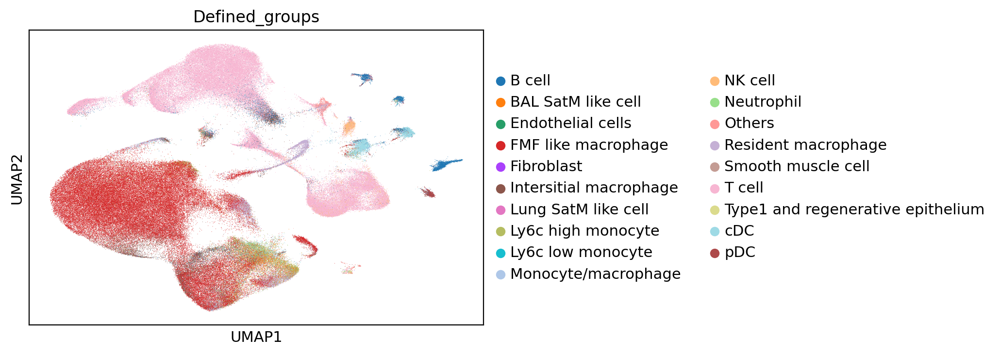

In [7]:
sc.pl.umap(adata, color = 'Defined_groups')

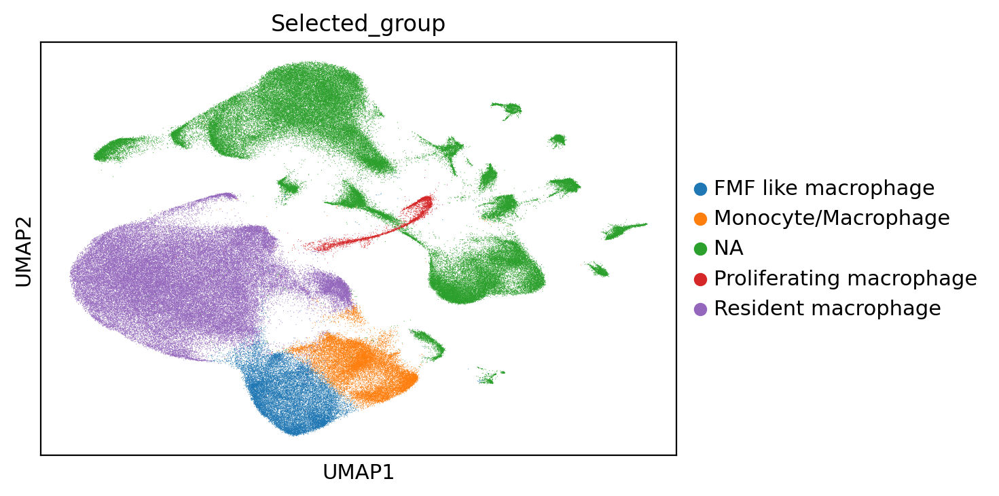

In [8]:
sc.pl.umap(adata, color = 'Selected_group')

In [9]:
sub = adata[adata.obs['Selected_group']!='NA']

In [10]:
del adata

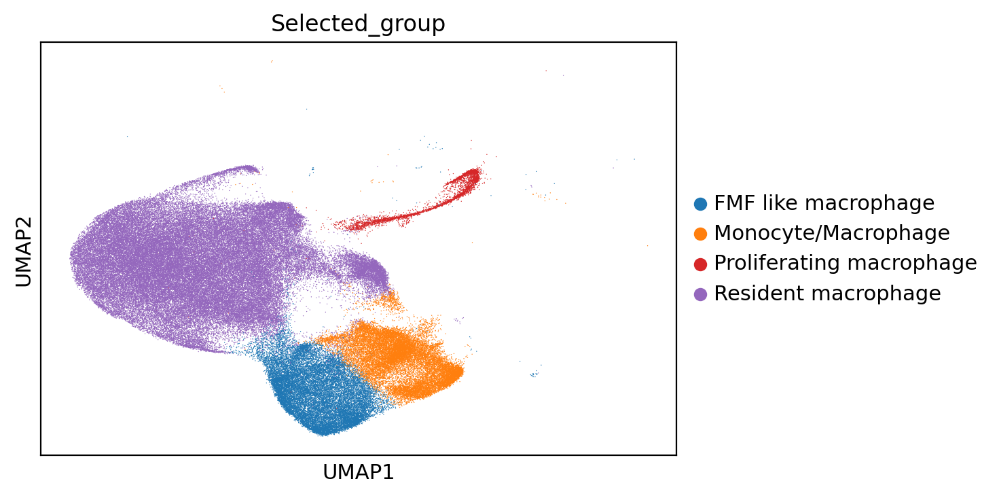

In [11]:
sc.pl.umap(sub, color = 'Selected_group')

In [12]:
for k in [ 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes']:
    del sub.var[k]

In [13]:
del sub.layers['Ms'] 
del sub.layers['Mu'] 

In [14]:
sub.write_h5ad(out_path+'/sub_velocity_human.h5ad')

In [15]:
sc.pp.neighbors(sub)

In [ ]:
scv.pp.moments(sub, n_pcs=30, n_neighbors=30)
scv.tl.recover_dynamics(sub,n_jobs=40)
scv.tl.velocity(sub, mode='dynamical')
scv.tl.velocity_graph(sub)
scv.tl.score_genes_cell_cycle(sub)
scv.pl.scatter(sub, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])
scv.tl.velocity_confidence(sub)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(sub, c=keys, cmap='coolwarm', perc=[5, 95])
#scv.pl.paga(adata, basis='umap', size=50, alpha=.1,min_edge_width=2, node_size_scale=0.5)
scv.pl.velocity_embedding_stream(sub, basis='umap',color ='Selected_group')

computing neighbors
    finished (0:01:21) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities


In [ ]:
sub

In [ ]:
for k in ['root_cells', 'end_points', 'velocity_pseudotime', 'latent_time']:
    del sub.obs[k]

In [ ]:
scv.tl.latent_time(sub)
scv.pl.scatter(sub, color='latent_time', color_map='gnuplot', size=80)
top_genes = sub.var['fit_likelihood'].sort_values(ascending=False).index[:50]
scv.pl.heatmap(sub, var_names=top_genes, sortby='latent_time', col_color='leiden', n_convolve=100)
scv.tl.paga(sub, groups='Selected_group',use_time_prior='latent_time')
scv.pl.paga(sub, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [ ]:
scv.pl.paga(sub, basis='umap', size=50, alpha=.05,threshold=0,
            min_edge_width=2, node_size_scale=1.5)

In [ ]:
sub.obs

In [ ]:
scv.tl.paga(sub, groups='human_clusters',use_time_prior='latent_time')
scv.pl.paga(sub, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [ ]:
scv.tl.paga(sub, groups='Defined_groups',use_time_prior='latent_time')
scv.pl.paga(sub, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [ ]:
sub.obs['Defined_groups'].value_counts()

In [38]:
import itertools

In [39]:
def Plot_cluster_pair(combo,cpdb_mean):
    a =combo[0]+'|'+combo[1]
    b =combo[1]+'|'+combo[0]
    x = cpdb_mean[pd.notna(cpdb_mean[a])][['interacting_pair',a]]
    new = x['interacting_pair'].str.split("_", n=1 ,expand = True)
    x[combo[0]] = new[0]
    x[combo[1]] = new[1]
    y=x.pivot_table(columns=combo[0], index=combo[1], values=a)
    x = cpdb_mean[pd.notna(cpdb_mean[b])][['interacting_pair',b]]
    new = x['interacting_pair'].str.split("_", n=1 ,expand = True)
    x[combo[1]] = new[0]
    x[combo[0]] = new[1]
    z=x.pivot_table(columns=combo[1], index=combo[0], values=b)
    fig, axs = plt.subplots(1,2,figsize=(25,10))
    fig.suptitle('Cell Cell Communication between '+combo[0]+' and '+combo[1])
    axs[0].set_title(combo[0]+' to '+combo[1])
    sb.heatmap(y,ax=axs[0],linewidths=0.5,xticklabels=1, yticklabels=1)
    axs[1].set_title(combo[1]+' to '+combo[0])
    sb.heatmap(z,ax=axs[1],linewidths=0.5,xticklabels=1, yticklabels=1)

In [40]:
cpdb_mean = pd.read_csv(cellphone_folder+'/out/significant_means.txt',sep='\t')

## Interaction of Defined Groups 

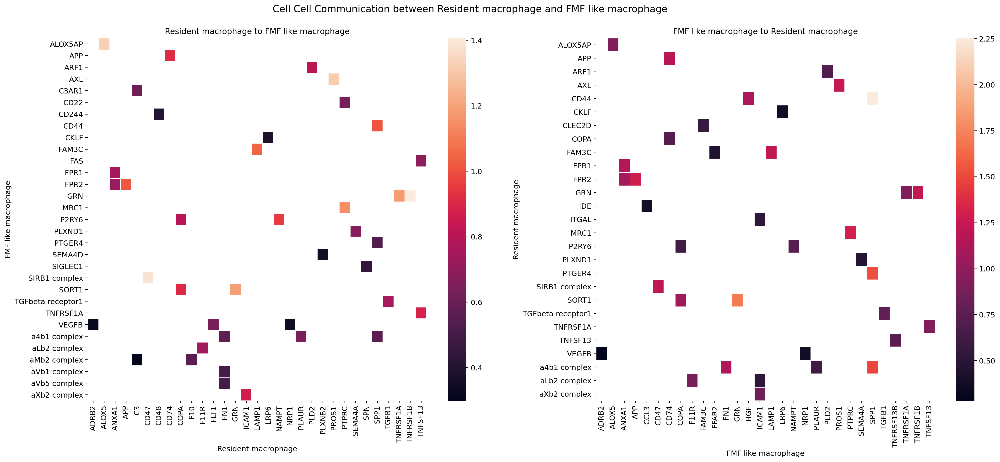

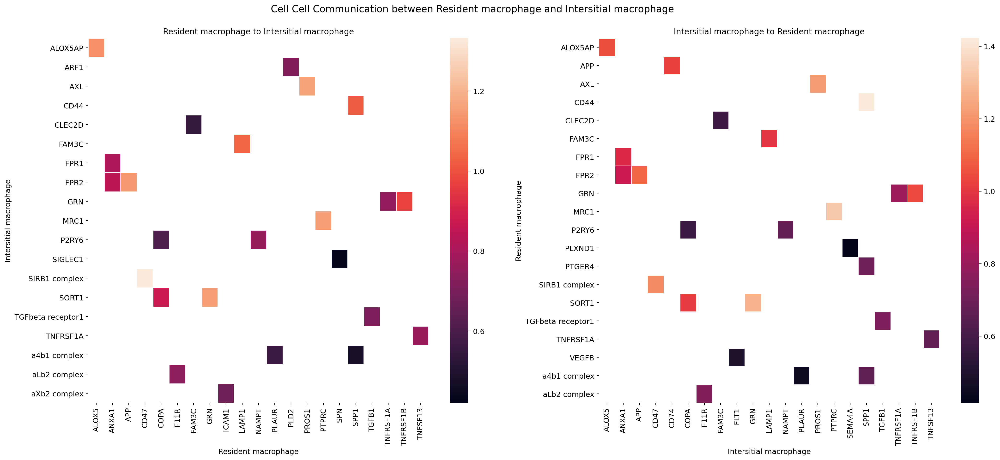

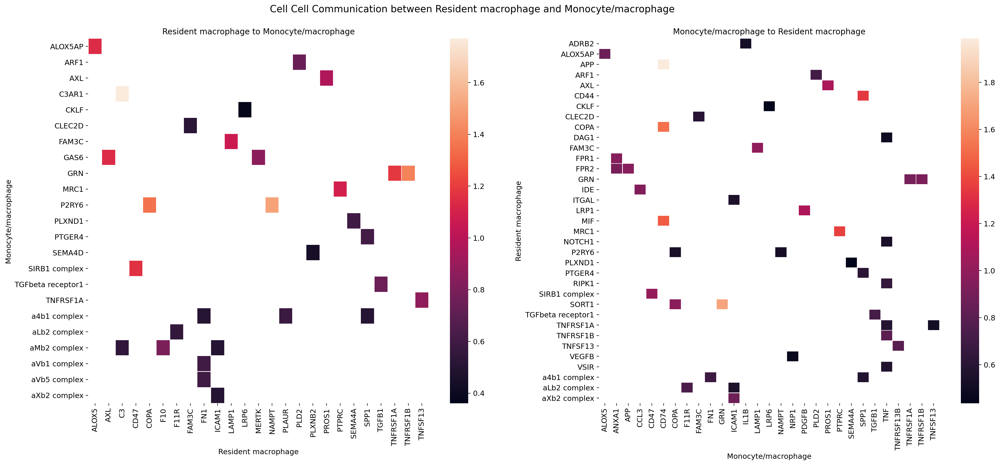

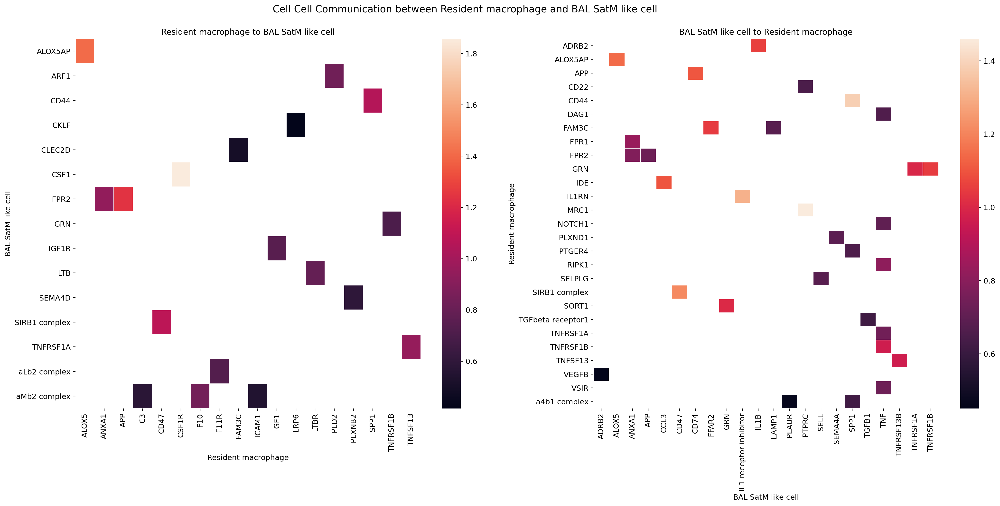

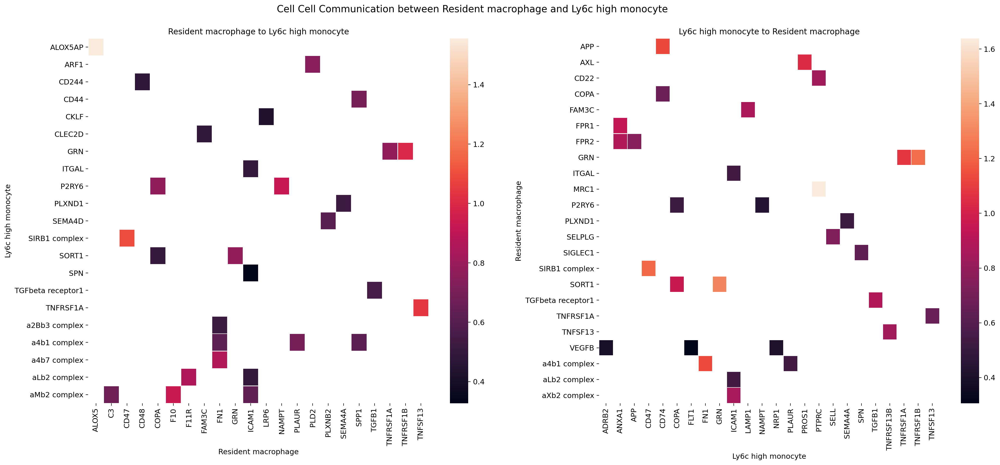

...

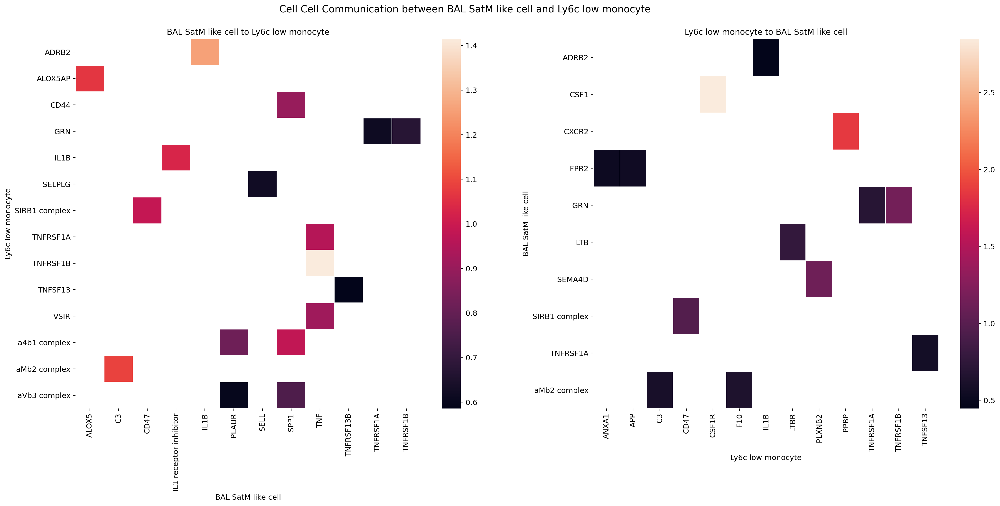

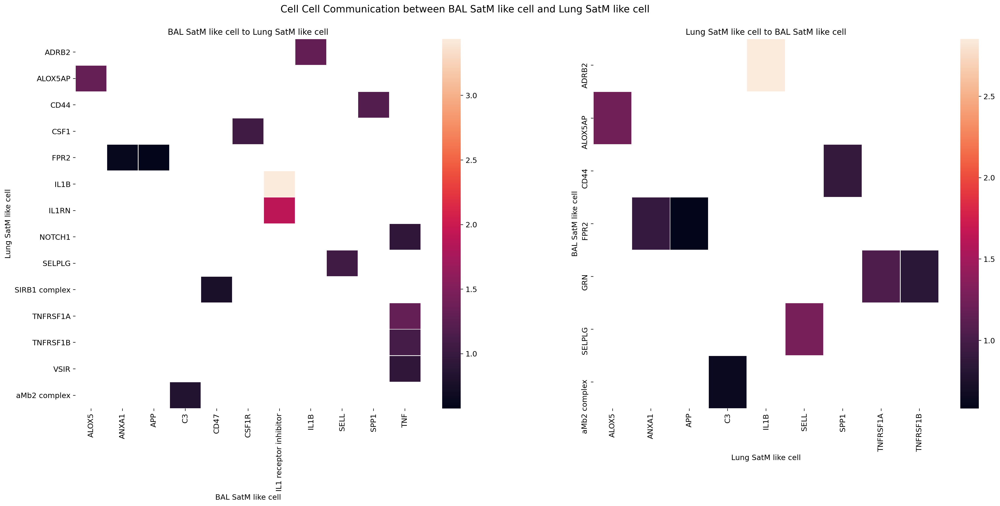

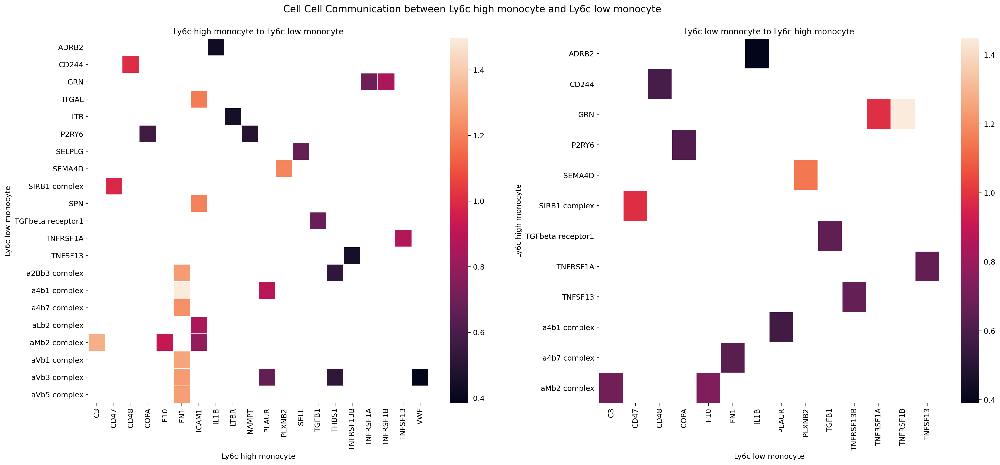

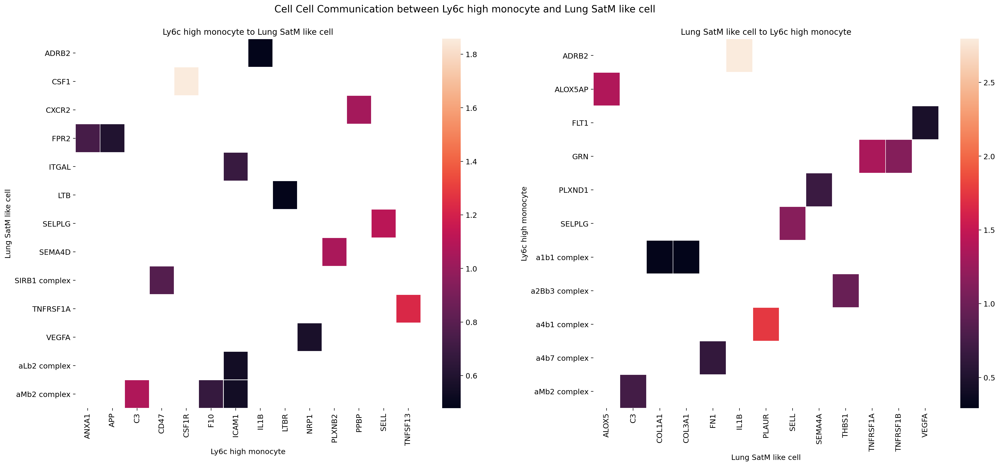

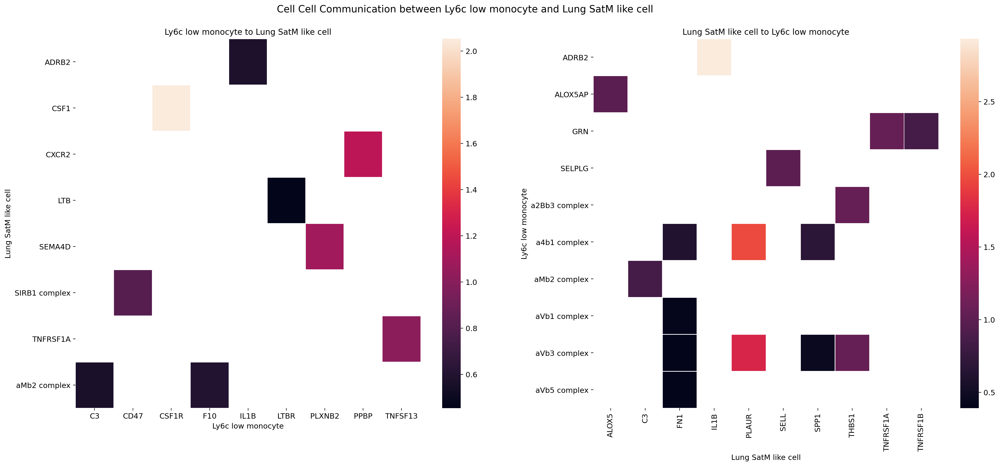

In [41]:
groups = sub.obs['Defined_groups'].unique().tolist()

for combo in itertools.combinations(groups, 2):
    Plot_cluster_pair(combo,cpdb_mean)cd

## TF MF analysis

In [45]:
import dorothea
regulons = dorothea.load_regulons(
    ['A','B','C','D','E'],   # Which levels of confidence to use (A most confident, E least confident)
    organism='Mouse' # If working with mouse, set to Mouse
)

In [46]:
dorothea.run(adata,        # Data to use
             regulons,     # Dorothea network
             center=True,  # Center gene expression by mean per cell
             num_perm=100, # Simulate m random activities
             norm=True,    # Normalize by number of edges to correct for large regulons
             scale=True,   # Scale values per feature so that values can be compared across cells
             use_raw=True, # Use raw adata, where we have the lognorm gene expression
             min_size=5,   # TF with less than 5 targets will be ignored
            )

15608 targets found
12 TFs with < 5 targets


100%|██████████| 100/100 [48:04<00:00, 28.85s/it]


In [47]:
TF_anndata = dorothea.extract(adata)

In [48]:
TF_anndata.write(out_path+'/TF_anndata.h5ad')


## Top differential TF activity by each cell type V.S. rest of the cells

In [56]:
tfs = dict()
for g in groups:
    df = dorothea.rank_tfs_groups(adata, groupby='Defined_groups', group=g)
    df.to_csv(out_path+'/Differential_TF_'+g.replace(' ','').replace('/','_')+'.csv')
    tf = df.head(4).index.values
    tfs[g] = tf
    


categories: B cell, BAL SatM like cell, Endothelial cells, etc.
var_group_labels: Resident macrophage, FMF like macrophage, Intersitial macrophage, etc.


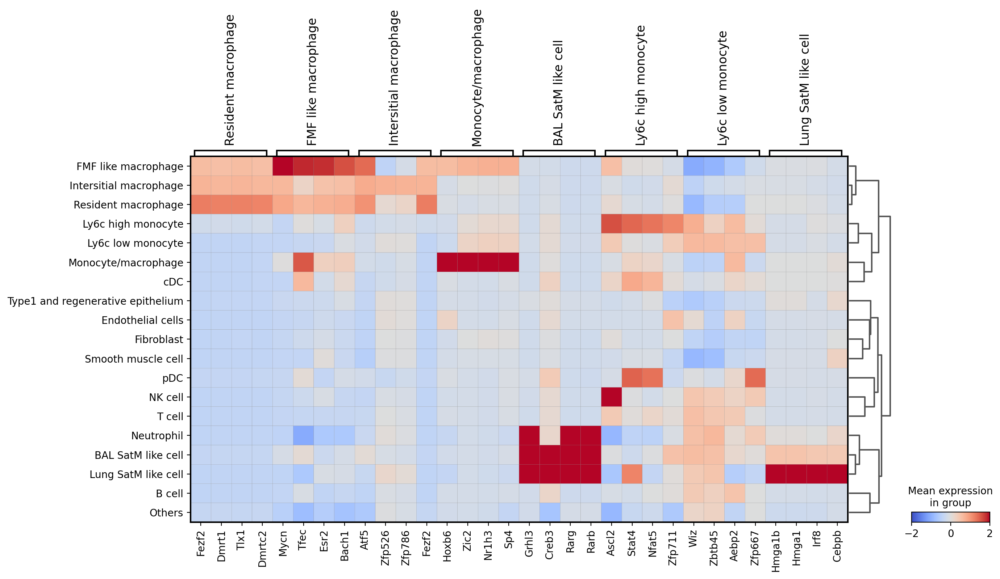

In [57]:
sc.pl.matrixplot(dorothea.extract(adata), tfs,'Defined_groups' , dendrogram=True, cmap='coolwarm', vmin=-2, vmax=2)

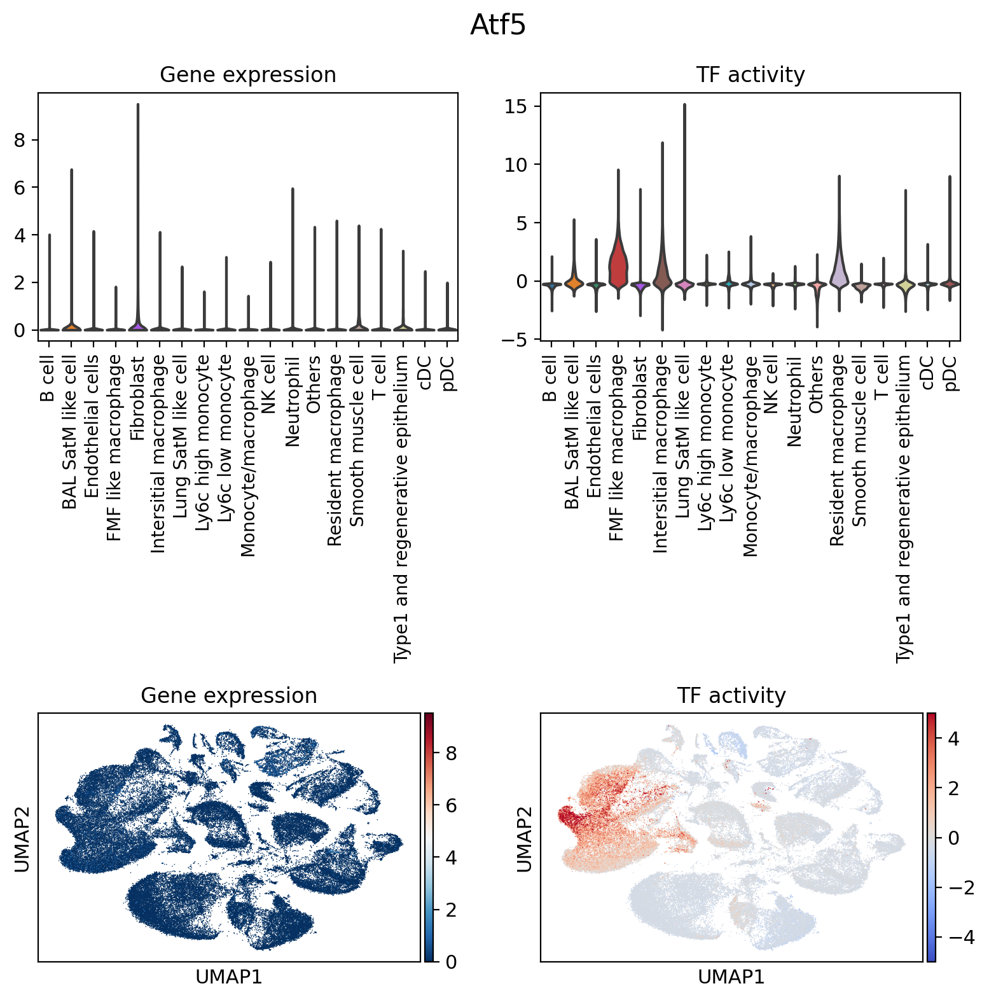

In [58]:
fig, ax = plt.subplots(2,2, figsize=(8,8), tight_layout=True, facecolor='white')
ax = ax.flatten()

tf = 'Atf5'
fig.suptitle(tf, fontsize=16)
sc.pl.violin(adata, keys=tf, groupby='Defined_groups', stripplot=False, ax=ax[0], show=False)
ax[0].tick_params(axis='x', rotation=90, labelsize=10)
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Gene expression')

sc.pl.violin(dorothea.extract(adata), keys=tf, groupby='Defined_groups', stripplot=False, ax=ax[1], show=False)
ax[1].tick_params(axis='x', rotation=90, labelsize=10)
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('TF activity')

sc.pl.umap(adata, color=tf, return_fig=False, ax=ax[2], show=False)
ax[2].set_title('Gene expression')
sc.pl.umap(dorothea.extract(adata), color=tf, vmin=-5, vmax=5, cmap='coolwarm', return_fig=False, ax=ax[3], show=False)
ax[3].set_title('TF activity')

plt.show()

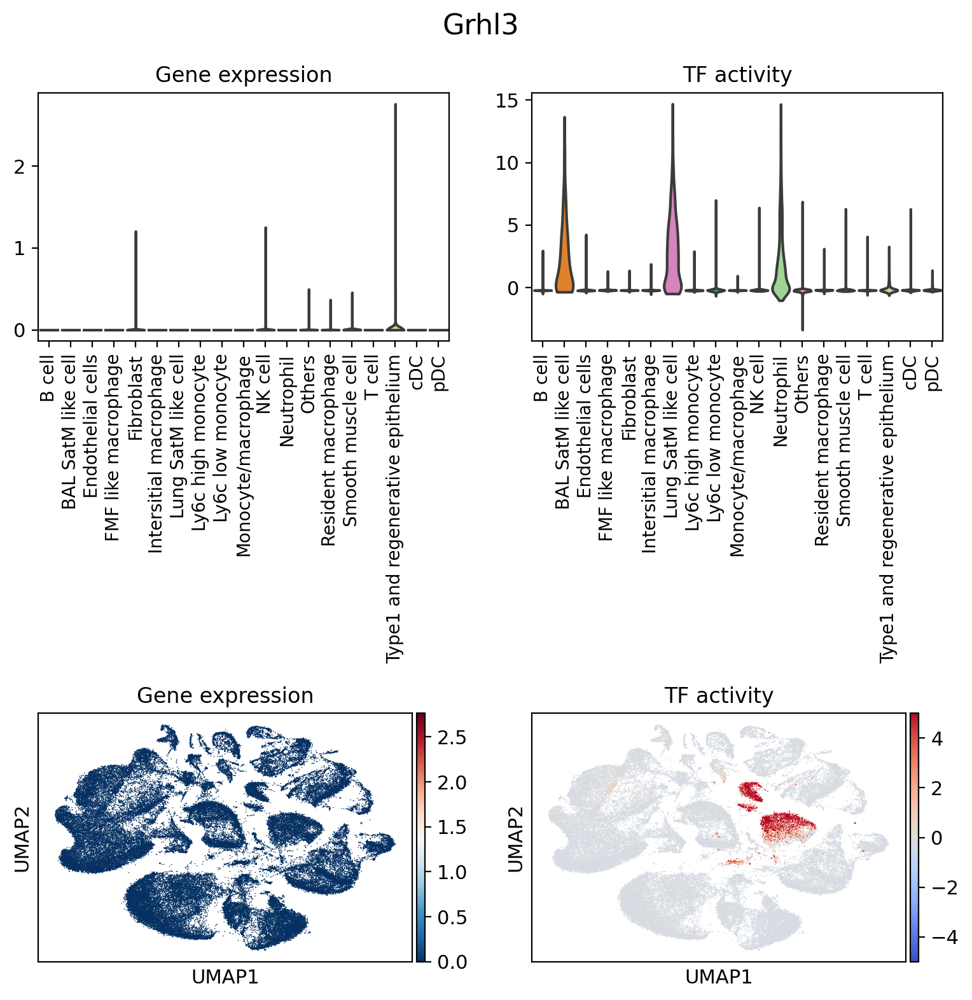

In [59]:
fig, ax = plt.subplots(2,2, figsize=(8,8), tight_layout=True, facecolor='white')
ax = ax.flatten()

tf = 'Grhl3'
fig.suptitle(tf, fontsize=16)
sc.pl.violin(adata, keys=tf, groupby='Defined_groups', stripplot=False, ax=ax[0], show=False)
ax[0].tick_params(axis='x', rotation=90, labelsize=10)
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Gene expression')

sc.pl.violin(dorothea.extract(adata), keys=tf, groupby='Defined_groups', stripplot=False, ax=ax[1], show=False)
ax[1].tick_params(axis='x', rotation=90, labelsize=10)
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('TF activity')

sc.pl.umap(adata, color=tf, return_fig=False, ax=ax[2], show=False)
ax[2].set_title('Gene expression')
sc.pl.umap(dorothea.extract(adata), color=tf, vmin=-5, vmax=5, cmap='coolwarm', return_fig=False, ax=ax[3], show=False)
ax[3].set_title('TF activity')

plt.show()

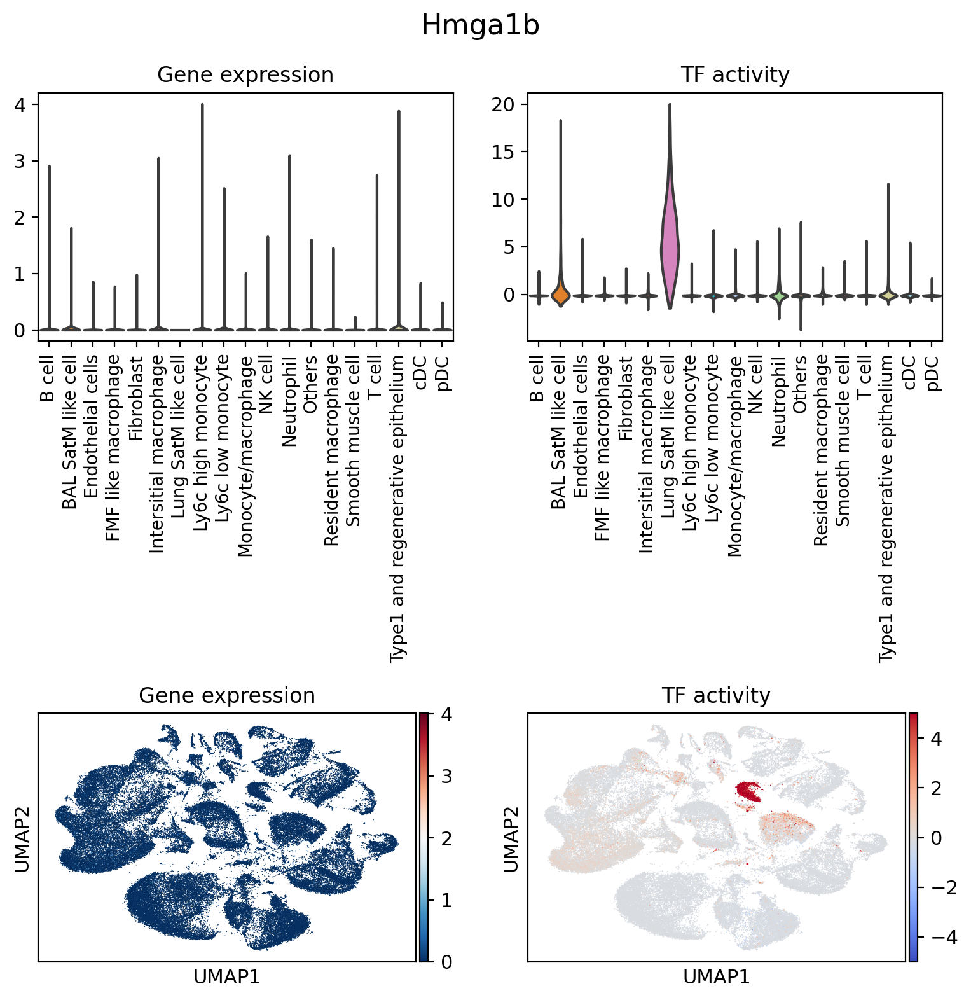

In [60]:
fig, ax = plt.subplots(2,2, figsize=(8,8), tight_layout=True, facecolor='white')
ax = ax.flatten()

tf = 'Hmga1b'
fig.suptitle(tf, fontsize=16)
sc.pl.violin(adata, keys=tf, groupby='Defined_groups', stripplot=False, ax=ax[0], show=False)
ax[0].tick_params(axis='x', rotation=90, labelsize=10)
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Gene expression')

sc.pl.violin(dorothea.extract(adata), keys=tf, groupby='Defined_groups', stripplot=False, ax=ax[1], show=False)
ax[1].tick_params(axis='x', rotation=90, labelsize=10)
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('TF activity')

sc.pl.umap(adata, color=tf, return_fig=False, ax=ax[2], show=False)
ax[2].set_title('Gene expression')
sc.pl.umap(dorothea.extract(adata), color=tf, vmin=-5, vmax=5, cmap='coolwarm', return_fig=False, ax=ax[3], show=False)
ax[3].set_title('TF activity')

plt.show()

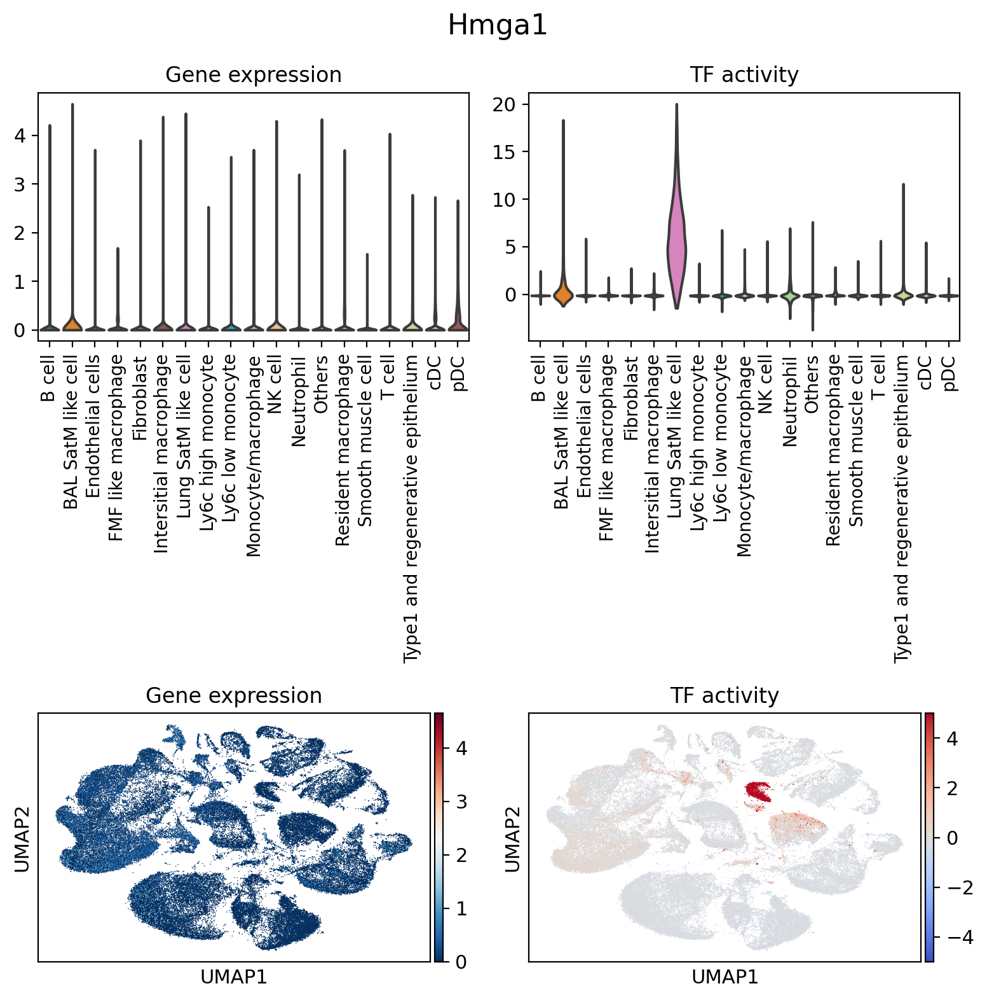

In [61]:
fig, ax = plt.subplots(2,2, figsize=(8,8), tight_layout=True, facecolor='white')
ax = ax.flatten()

tf = 'Hmga1'
fig.suptitle(tf, fontsize=16)
sc.pl.violin(adata, keys=tf, groupby='Defined_groups', stripplot=False, ax=ax[0], show=False)
ax[0].tick_params(axis='x', rotation=90, labelsize=10)
ax[0].set_ylabel('')
ax[0].set_xlabel('')
ax[0].set_title('Gene expression')

sc.pl.violin(dorothea.extract(adata), keys=tf, groupby='Defined_groups', stripplot=False, ax=ax[1], show=False)
ax[1].tick_params(axis='x', rotation=90, labelsize=10)
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].set_title('TF activity')

sc.pl.umap(adata, color=tf, return_fig=False, ax=ax[2], show=False)
ax[2].set_title('Gene expression')
sc.pl.umap(dorothea.extract(adata), color=tf, vmin=-5, vmax=5, cmap='coolwarm', return_fig=False, ax=ax[3], show=False)
ax[3].set_title('TF activity')

plt.show()